Vamos trabalhar com amostras de vinho verde (branco e tinto) produzidos em Portugal para prever as preferências humanas pelo sabor do vinho. A escolha desta base foi proposta pelo professor. Além disso, cabe ressaltar que todo o tratamento de dados será feito especificamente para o vinho branco.

Estes dados foram coletados utilizando apenas amostras de denominação de origem protegida que foram testadas na entidade certificadora oficial. Os dados foram registados por um sistema informatizado (iLab), que gerencia automaticamente o processo de análise de amostras de vinho desde solicitações do produtor até análises laboratoriais e sensoriais. Cada entrada denota um determinado teste (analítico ou sensorial) e o banco de dados final foi exportado para uma única planilha (.csv).

In [1]:
# Importação das bibliotecas necessárias para analisar/transformar os dados
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore',category=Warning)

In [2]:
# Download da base
df_wine = pd.read_csv(os.getcwd()+f'//..//..//data//raw//winequalityN.csv')
df_wine.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [3]:
# Separando a variável: vinho branco 
df_white = df_wine.drop(df_wine.index[df_wine['type'] == 'red'])
df_white.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [4]:
# Criando a variável opinion e removendo a variável quality
df_white['opinion'] = df_white['quality'].apply(lambda x: 0 if x <= 5 else 1)
df_white = df_white.drop(['quality'],axis=1)
df_white.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,1
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,1
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,1
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,1
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,1


**Como vamos tratar inicialmente somente os vinhos brancos, não faz sentido manter a coluna "type", portanto ela também será removida.**

In [5]:
# Excluindo variável "type"
df_white = df_white.drop(['type'],axis=1)

**Segue abaixo o total de obervações de cada variável, as médias, os desvios padrões, o limite inferior, o primeiro quartil, o segundo quartil (mediana), o terceiro quartil e o limite superior.**

In [6]:
# Estatística descritiva
df_white.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,4890.0,6.855532,0.843808,3.80000,6.300000,6.80000,7.3000,14.20000
volatile acidity,4891.0,0.278252,0.100811,0.08000,0.210000,0.26000,0.3200,1.10000
citric acid,4896.0,0.334250,0.120985,0.00000,0.270000,0.32000,0.3900,1.66000
residual sugar,4896.0,6.393250,5.072275,0.60000,1.700000,5.20000,9.9000,65.80000
chlorides,4896.0,0.045778,0.021850,0.00900,0.036000,0.04300,0.0500,0.34600
free sulfur dioxide,4898.0,35.308085,17.007137,2.00000,23.000000,34.00000,46.0000,289.00000
total sulfur dioxide,4898.0,138.360657,42.498065,9.00000,108.000000,134.00000,167.0000,440.00000
density,4898.0,0.994027,0.002991,0.98711,0.991723,0.99374,0.9961,1.03898
pH,4891.0,3.188203,0.151014,2.72000,3.090000,3.18000,3.2800,3.82000
sulphates,4896.0,0.489835,0.114147,0.22000,0.410000,0.47000,0.5500,1.08000


In [7]:
# Informações sobre o data frame
df_white.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4890 non-null   float64
 1   volatile acidity      4891 non-null   float64
 2   citric acid           4896 non-null   float64
 3   residual sugar        4896 non-null   float64
 4   chlorides             4896 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4891 non-null   float64
 9   sulphates             4896 non-null   float64
 10  alcohol               4898 non-null   float64
 11  opinion               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [8]:
# Verificando se há linhas duplicadas
dupli = df_white[df_white.duplicated()]
dupli

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
4,7.2,0.23,0.32,8.50,0.058,47.0,186.0,0.99560,3.19,0.40,9.900000,1
5,8.1,0.28,0.40,6.90,0.050,30.0,97.0,0.99510,3.26,0.44,10.100000,1
7,7.0,0.27,0.36,20.70,0.045,45.0,170.0,1.00100,3.00,0.45,8.800000,1
8,6.3,0.30,0.34,1.60,0.049,14.0,132.0,0.99400,3.30,0.49,9.500000,1
39,7.3,0.24,0.39,17.95,0.057,45.0,149.0,0.99990,3.21,0.36,8.600000,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4828,6.4,0.23,0.35,10.30,0.042,54.0,140.0,0.99670,3.23,0.47,9.200000,0
4850,7.0,0.36,0.35,2.50,0.048,67.0,161.0,0.99146,3.05,0.56,11.100000,1
4851,6.4,0.33,0.44,8.90,0.055,52.0,164.0,0.99488,3.10,0.48,9.600000,0
4856,7.1,0.23,0.39,13.70,0.058,26.0,172.0,0.99755,2.90,0.46,9.000000,1


In [9]:
# Verificando dados faltantes
missing_data = df_white.isna().sum()
missing_data

fixed acidity           8
volatile acidity        7
citric acid             2
residual sugar          2
chlorides               2
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      7
sulphates               2
alcohol                 0
opinion                 0
dtype: int64

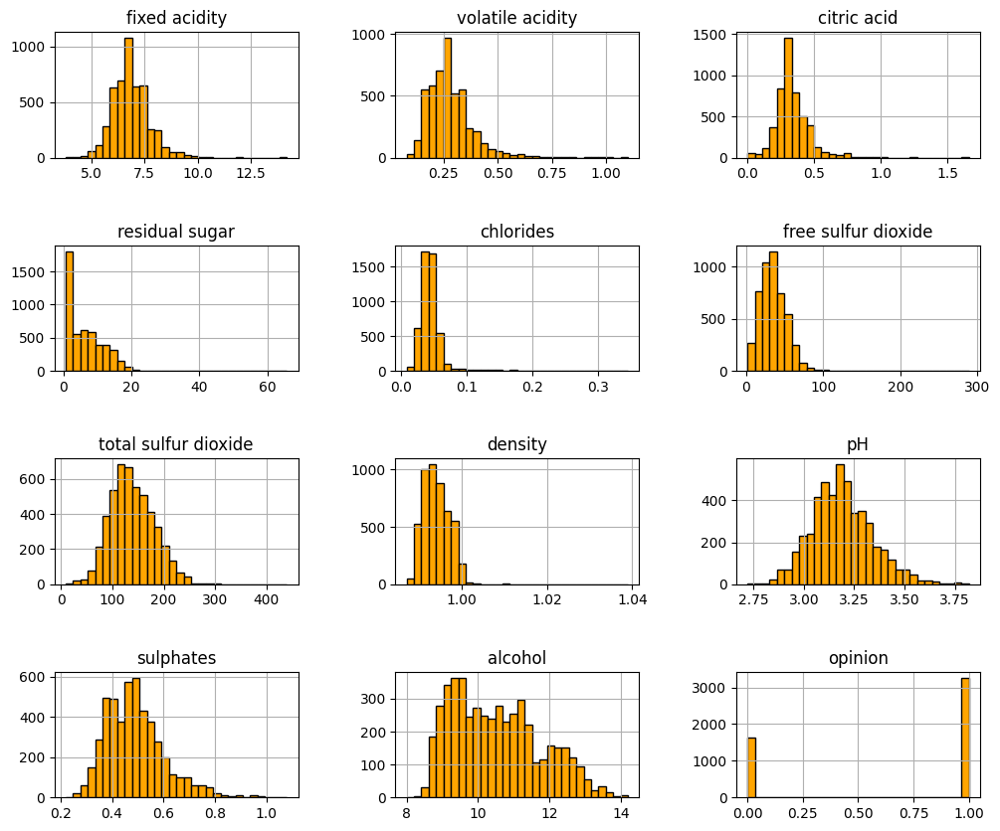

In [10]:
# Histogramas
df_white.hist(figsize=(12, 10), bins=30, edgecolor="black",color='orange')
plt.subplots_adjust(hspace=0.7, wspace=0.4)

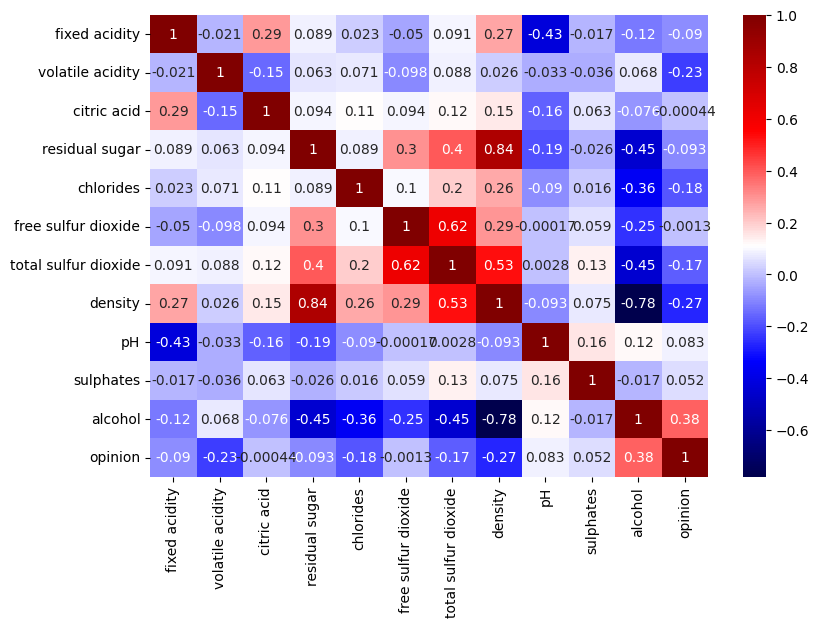

In [11]:
# Análise das correlações
plt.figure(figsize=(9,6))
sns.heatmap(df_white.corr(),annot=True,cmap='seismic')
plt.show()

Observa-se que os pares de variáveis "density"/"residual sugar" e "density"/"alcohol" possuem correlação forte, sendo negativa o último par. Correlações fortes quando analisadas pela ótica da multicolinearidade, podem trazer alguns problemas ao modelo. Há algumas formas de identificar a multicolinearidade, como por exemplo: valores altos do coeficiente de correlação; grandes alterações dos coeficientes de regressão - quando adicionamos ou removemos uma váriavel independente, ou quando há mudanças ou exclusões de observações no modelo; dentre outras. Uma das formas mais comuns para detectar a multicolinearidade é por meio do fator de inflação da variância (VIF). E como resolver este impasse? Alguns métodos são utilizados, como por exemplo: 1) a remoção de uma ou mais variaveis independentes que estejam altamente correlacionadas e identificar outras variáveis independentes para ajudar na previsão. Obviamente procedimentos como este não devem ser feitos à revelia, pois podemos perder informações importantes contidas nas variáveis removidas; 2) ACP (Análise de Componentes Principais); 3) AF (Análise Fatorial); dentre outros.

Cabe ressaltar que este tipo de abordagem não será feita neste projeto.

<Figure size 1500x800 with 0 Axes>

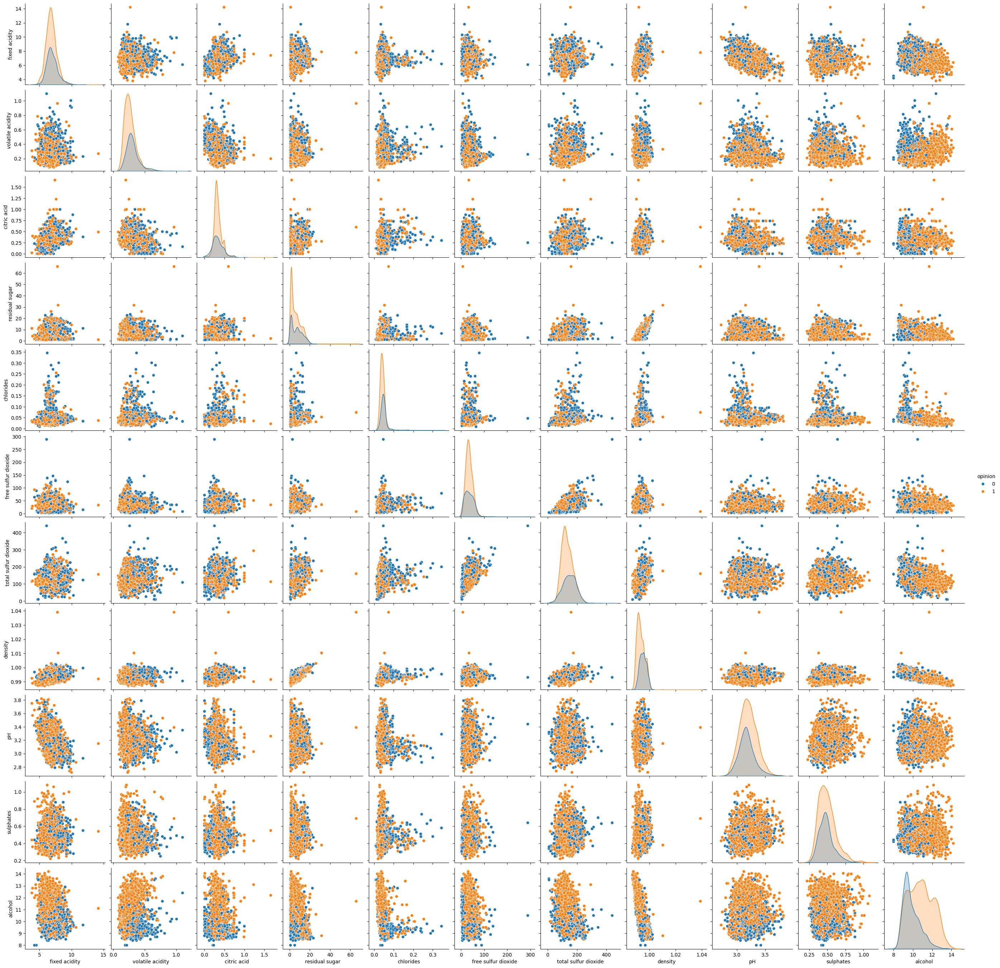

In [12]:
# Análise do gráfico de dispersão aos pares
plt.figure(figsize=(15,8))
df_white[['fixed acidity','volatile acidity','citric acid','residual sugar','chlorides','free sulfur dioxide','total sulfur dioxide','density','pH','sulphates','alcohol','opinion']]
sns.pairplot(df_white, hue='opinion')
plt.show()


**Observações estatísticas, mas que também não serão implementadas neste projeto:**

 **Apenas com a simples inspeção do gráficos acima não dá para afirmar que cada variável tem influência direta na qualidade do vinho. Para isso cabe o teste do qui-quadrado, que vai analisar estatisticamente se há ou não correlação entre a variável dependente e as variáveis independentes.**

**Agora vamos separar duas categorias de boxplots para uma melhor visualização. Uma com pequeno intervalo de valores e outra com um intervalo maior.**

```Primeira categoria```

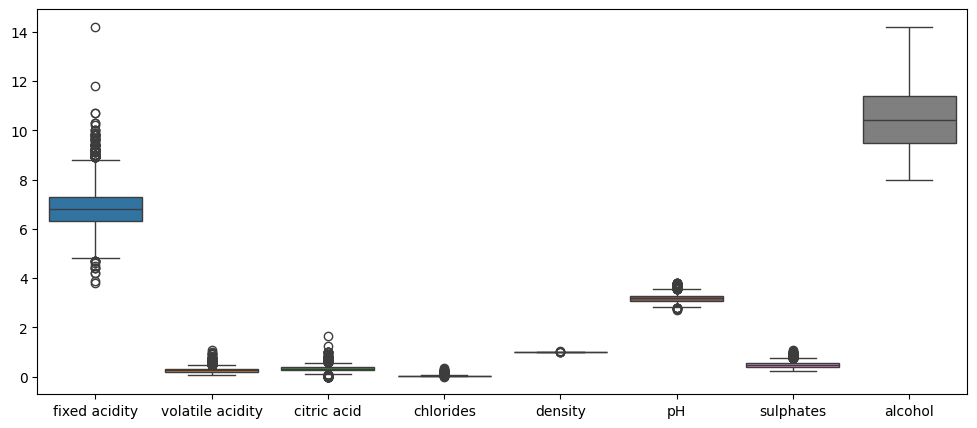

In [13]:
df_select_low_nums_white_1 = df_white[['fixed acidity','volatile acidity','citric acid','chlorides','density','pH','sulphates','alcohol']]
plt.figure(figsize=(12,5))
sns.boxplot(df_select_low_nums_white_1)
plt.show()

```Segunda categoria```

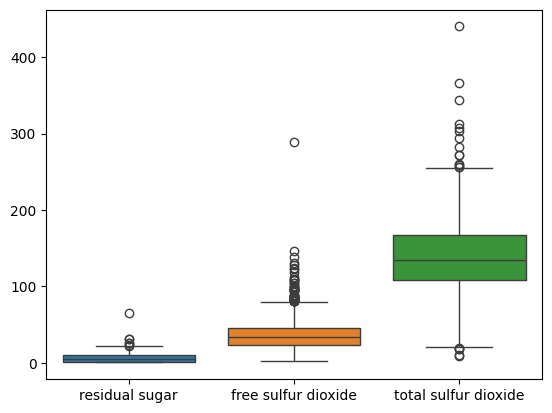

In [14]:
df_select_high_nums_white_1 = df_white[['residual sugar','free sulfur dioxide', 'total sulfur dioxide']]
sns.boxplot(df_select_high_nums_white_1)
plt.show()

**Vamos começar o tratamento dos dados.** 

**Dados duplicados podem gerar: viés nos resultados, overfitting, dificuldades para interpretar o modelo, ineficiência computacional e validação cruzada, portanto, vamos excluí-los.**


In [15]:
# Excluindo dados duplicados
df_white = df_white.drop_duplicates().reset_index(drop=True)
df_white

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3965,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3966,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3967,6.5,NaN,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,1
3968,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


In [16]:
df_white[df_white.isnull().any(axis=1)]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
13,NaN,0.660,0.48,1.2,0.029,29.0,75.0,0.98920,3.33,0.39,12.8,1
29,6.2,0.120,0.34,NaN,0.045,43.0,117.0,0.99390,3.42,0.51,9.0,1
48,6.8,0.200,0.59,0.9,0.147,38.0,132.0,0.99300,NaN,0.38,9.1,1
76,7.2,NaN,0.63,11.0,0.044,55.0,156.0,0.99740,3.09,0.44,8.7,1
86,9.8,0.360,0.46,10.5,NaN,4.0,83.0,0.99560,2.89,0.30,10.1,0
120,8.1,0.280,0.39,1.9,0.029,18.0,79.0,0.99230,NaN,0.52,11.8,1
149,NaN,0.270,0.31,17.7,0.051,33.0,173.0,0.99900,3.09,0.64,10.2,0
192,6.3,0.495,0.22,1.8,0.046,31.0,140.0,0.99290,3.39,NaN,10.4,1
212,NaN,0.410,0.14,10.4,0.037,18.0,119.0,0.99600,3.38,0.45,10.0,0
227,NaN,0.580,0.07,6.9,0.043,34.0,149.0,0.99440,3.34,0.57,9.7,0


In [17]:
# Excluindo dados faltantes
df_white = df_white.dropna()
df_white = df_white.reset_index(drop=True)
df_white

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


Aqui foi adotado a seguinte prescrição: temos um total de 30 dados faltantes que representam 0,7% da amostra total de vinhos brancos, portanto optamos em excluir estes dados, já que as análises descritivas antes e depois da remoção ficaram praticamente inalteradas.
Além disso, foi escolhido não substituir os valores faltantes por zero, ou pela média, ou pela mediana ou pelo valor mais repetido da respectiva porque poderia gerar um grau de enviesamento quando o modelo fosse testado para outro tipo de vinho.

Ao excluir os dados duplicados o dataset ficou com  3970 observações. Em seguida vimos que temos 30 dados faltantes, portanto, ao excluí-los o resultado deveria ser 3940, porém, conforme mostramos acima temos 3942 linhas. Isso ocorre porque existem mais de 2 linhas com NaN, logo, na verdade são 28 dados deste tipo.

In [18]:
# Análise descritiva - estatísticas básicas após tratamento dos dados
df_white.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,3942.0,6.840297,0.866067,3.80000,6.3000,6.8000,7.30000,14.20000
volatile acidity,3942.0,0.280430,0.103256,0.08000,0.2100,0.2600,0.32875,1.10000
citric acid,3942.0,0.334490,0.122404,0.00000,0.2700,0.3200,0.39000,1.66000
residual sugar,3942.0,5.918721,4.861389,0.60000,1.6000,4.7000,8.87500,65.80000
chlorides,3942.0,0.045887,0.023088,0.00900,0.0350,0.0420,0.05000,0.34600
free sulfur dioxide,3942.0,34.918062,17.227540,2.00000,23.0000,33.0000,45.00000,289.00000
total sulfur dioxide,3942.0,137.215753,43.128509,9.00000,106.0000,133.0000,166.00000,440.00000
density,3942.0,0.993788,0.002907,0.98711,0.9916,0.9935,0.99571,1.03898
pH,3942.0,3.195287,0.151345,2.72000,3.0900,3.1800,3.29000,3.82000
sulphates,3942.0,0.490236,0.113653,0.22000,0.4100,0.4800,0.55000,1.08000


**Analisando os boxplots, precisaremos tratar alguns outliers. Para justificar a exclusão destes valores referentes à variável 'fixed acidity', tomamos como base a referência: https://www.randoxfood.com/why-is-testing-for-tartaric-acid-important-in-wine-making/ . A acidez fixa, expressa em g/dm3 de ácido tartárico, deve estar dentro do intervalo de 0.5 a 10 g/dm3.**

In [19]:
df_select = df_white[(df_white['fixed acidity'] >= 10)]
df_white_1 = df_white.drop(df_select.index)
df_white_1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


**De acordo com https://www.ivv.gov.pt/np4/89/ o ácido cítrico deve ter valor máximo igual a 1 g/dm3, portanto também removeremos esses outliers.**

In [20]:
df_select_1 = df_white_1[(df_white_1['citric acid'] > 1)]
df_white_2 = df_white_1.drop(df_select_1.index)
df_white_2

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


**Podemos ver também que a quantidade de "free sulfur dioxide" e "total sulfur dioxide" possuem valores acima do limite permitido para o vinho branco. Veja as referências:**
**https://www.ivv.gov.pt/np4/89/**
**https://www.oiv.int/public/medias/7840/oiv-collective-expertise-document-so2-and-wine-a-review.pdf**
**https://diariodarepublica.pt/dr/detalhe/portaria/610-1972-690063**

**Assim, todos os valores fora dos intervalos abaixo serão considerados outliers e posteriormente excluídos.**

**- quando "residual sugar" >= 5 mg/dm3 --> "total sulfur dioxide" deve assumir valores <= 250 mg/dm3;**

**- quando "residual sugar" < 5 mg/dm3--> "total sulfur dioxide" deve assumir valores <= 200 mg/dm3;** 

**- "free sulfur dioxide" <= 70 mg/dm3.**

**Também foi observado uma ocorrência de dois outliers fora do limite inferior na coluna 'total sulfur dioxide', respectivamente iguais a 9 mg/dm3 e 10 mg/dm3, como são apenas dois valores, eles serão removidos.**

In [21]:
df_select_2 = df_white_2[(df_white_2['residual sugar'] >= 5) & (df_white_2['total sulfur dioxide'] > 250)]
df_white_3 = df_white_2.drop(df_select_2.index)
df_white_3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


In [22]:
df_select_3 = df_white_3[(df_white_3['residual sugar'] < 5 ) & (df_white_3['total sulfur dioxide'] > 200)]
df_white_4 = df_white_3.drop(df_select_3.index)
df_white_4

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


In [23]:
df_select_4 = df_white_4[(df_white_4['free sulfur dioxide'] > 77)]
df_white_5 = df_white_4.drop(df_select_4.index)
df_white_5


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


In [24]:
df_select_5 = df_white_5[(df_white_5['total sulfur dioxide'] <= 10)]
df_white_6 = df_white_5.drop(df_select_5.index)
df_white_6

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


**Apesar de existirem vinhos com açúcar residual igual a 31.6 g/dm3 e 65.8 g/cm3, podemos ver que somente 2 vinhos possuem estes valores, o que representa 0,05%, portanto, não faz sentido mantê-lo na análise já que eles se comportam como valores bem discrepantes.**

In [25]:
df_select_6 = df_white_6[(df_white_6['residual sugar'] >= 31.6)]
df_white_final = df_white_6.drop(df_select_6.index)
df_white_final

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


In [26]:
# Exportando arquivo final dos vinhos brancos

df_white_final.to_csv(os.getcwd()+f'//..//..//data//processed//df_white_final.csv')
print(f'Arquivo salvo com sucesso.')

Arquivo salvo com sucesso.


```Novos boxplot após os dados terem sido tratados.```

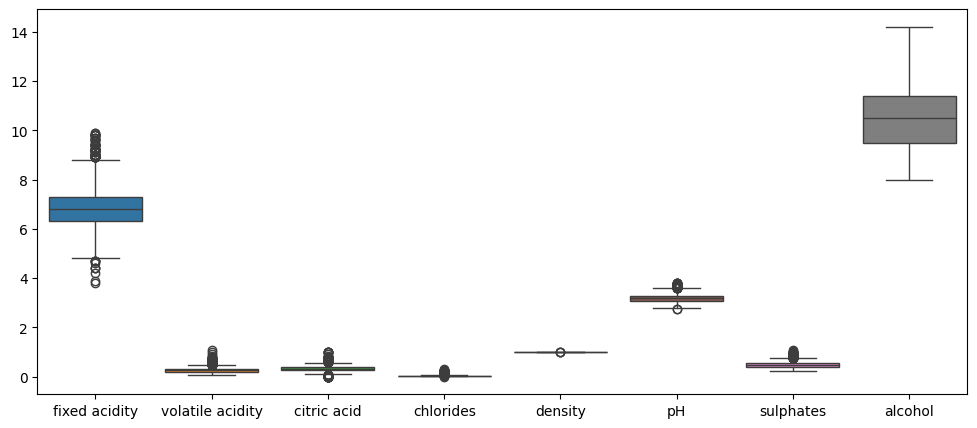

In [27]:
df_select_low_nums_white_2= df_white_final[['fixed acidity','volatile acidity','citric acid','chlorides','density','pH','sulphates','alcohol']]
plt.figure(figsize=(12,5))
sns.boxplot(df_select_low_nums_white_2)
plt.show()

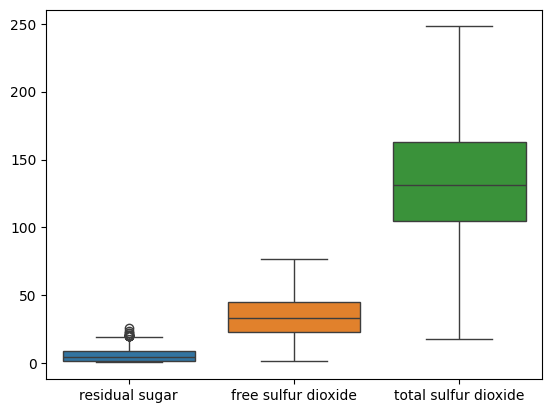

In [28]:
df_select_high_nums_white_2 = df_white_final[['residual sugar','free sulfur dioxide', 'total sulfur dioxide']]
sns.boxplot(df_select_high_nums_white_2)
plt.show()

```Novos histogramas```

**Observe como algumas distribuições se aproximaram ainda mais de uma normal quando fizemos o tratamento dos dados.**

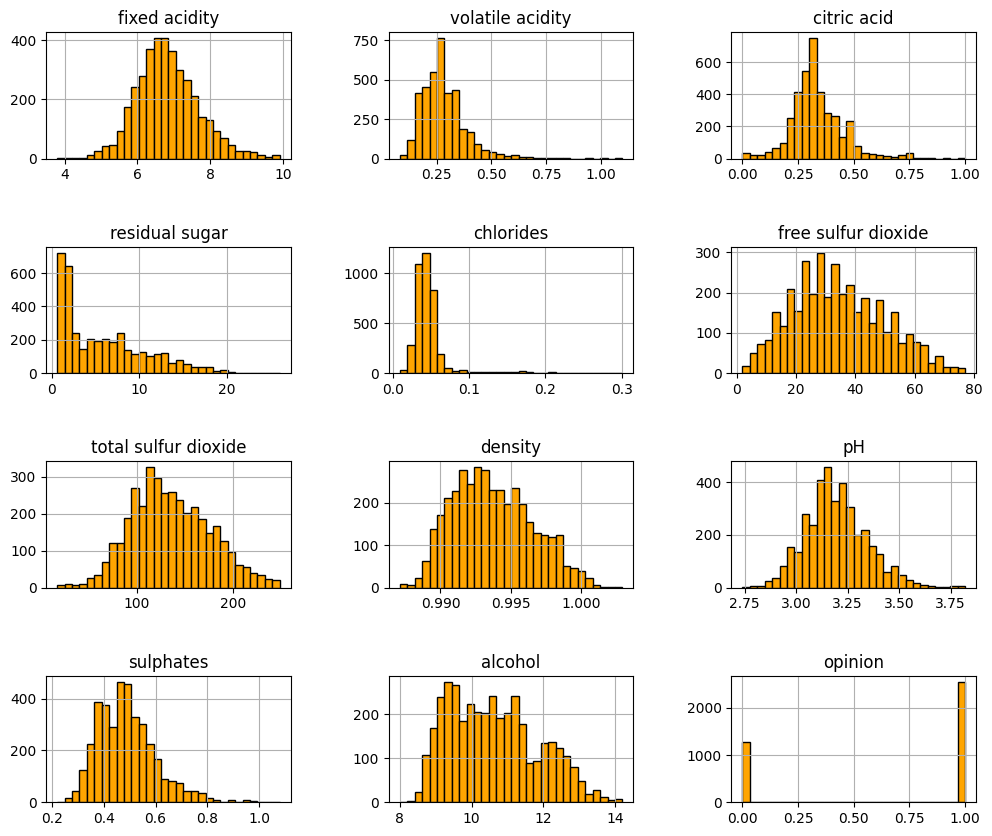

In [29]:
df_white_final.hist(figsize=(12, 10), bins=30, edgecolor="black",color='orange')
plt.subplots_adjust(hspace=0.7, wspace=0.4)


 **Mesmo com algumas melhorias, ainda não podemos afirmar se há influência individual de cada variável na qualidade do vinho.**

<Figure size 1500x800 with 0 Axes>

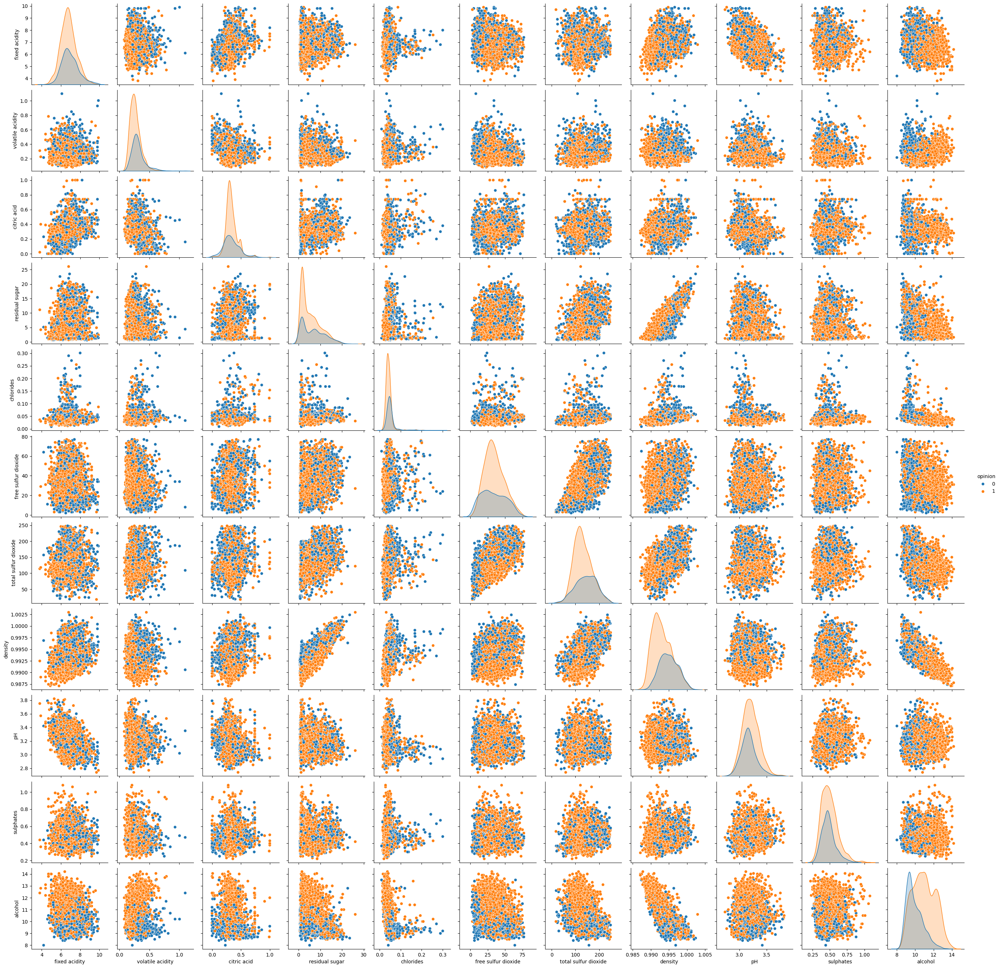

In [30]:
plt.figure(figsize=(15,8))
df_white_final[['fixed acidity','volatile acidity','citric acid','residual sugar','chlorides','free sulfur dioxide','total sulfur dioxide','density','pH','sulphates','alcohol','opinion']]
sns.pairplot(df_white_final, hue='opinion')
plt.show()